In [1]:
%matplotlib widget
import json
from itertools import product
from functools import partial, reduce
from copy import deepcopy
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy as sp
import seaborn as sns
import tempfile
import multiprocessing as mp

import hopsy
import plotly.express as px
from diskcache import Cache
from freeflux import Model
from pathlib import Path
from tqdm import tqdm
from scipy.spatial.distance import pdist, cdist, cosine

from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error

from mfa import (
    reac2array,
    create_add_constraints,
    get_model,
    make_bounds, 
    sample_fluxes, 
    get_mdv_results, 
    get_mdv_results_from_simulations,
    get_single_sim_result,
    get_reconex_fluxes,
    get_flux_ratio,
    get_flux_ratio_onlypos,
    get_flux_ratio,
    get_all_flux_ratios,
    subset_fluxes_by_binned_flux_ratio,
    subset_mdvs_by_binned_flux_ratio,
    train_rf
)
from flux_mdv_utils import (
    xy_line, 
    melt_flux_df, 
    melt_mdv_df,
    get_sumoflux_fluxes,
    get_flux_ratio,
    get_highest_flux_diff,
    get_highest_mdv_diff,
    convert_sumoflux_notation,
    plot_fluxes,
    plot_mdvs_boxplots,
    plot_rf_results
)

sns.set_theme()

cache = Cache("../.cache")

output_dir = Path("../Output") / Path(__session__).stem
output_dir.mkdir(parents=True, exist_ok=True)

parallel = 100


def read_config(path_to_file):
    with open(path_to_file) as fh:
        return json.load(fh)

def get_feat_importance(rf_results, feature_names):
    return pd.concat([
        (
            pd.DataFrame({
                "feature": feature_names, 
                "importance": ratio_res[0].feature_importances_
            })
            .assign(ratio_name=ratio_name)
            .sort_values("importance", ascending=False)
        ) for ratio_name, ratio_res in rf_results.items()
    ])

def predict_interval(model, X, lower=5, upper=95):
    # Collect predictions from all individual trees
    tree_preds = np.array([tree.predict(X) for tree in model.estimators_])
    # tree_preds shape: (n_estimators, n_samples)
    
    lower_bound = np.percentile(tree_preds, lower, axis=0)
    upper_bound = np.percentile(tree_preds, upper, axis=0)
    point_pred  = np.mean(tree_preds, axis=0)
    
    return point_pred, lower_bound, upper_bound

def get_rf_pred_results(rf_dict, df_exp, condition, q_lower=10, q_upper=90, replace_w_nans=True):
    pred_df = (
        pd.DataFrame([
            [
                condition, 
                ratio_name, 
                *predict_interval(ratio_res[0], df_exp.mdv.to_frame().transpose().values, q_lower, q_upper), 
                *ratio_res[1].values()
            ] 
            for ratio_name, ratio_res in rf_dict.items()
        ], columns=(
            "condition", 
            "flux_ratio", 
            "pred", 
            "pred_q10", 
            "pred_q90",
            "mae", 
            "cv_mae_mean", 
            "cv_mae_sd"
        ))
        .explode(["pred", "pred_q10", "pred_q90"])
        .pipe(lambda x: x.join(x.flux_ratio.str.extract(r"(?P<nucleoside>.*)_(?P<flux_ratio_name>.*)")))
    )
    
    if replace_w_nans and df_exp.mdv.isna().any():
        pred_df = pred_df.assign(pred=np.nan, pred_q10=np.nan, pred_q90=np.nan)
    return pred_df

def lineplots(data, x="pred", y="condition", **kwargs):
    sns.stripplot(
        data,
        x=x,
        y=y,
        hue=y,
    )
    
    sns.lineplot(
        data
        .melt(
            id_vars=list({"condition", "flux_ratio", y}), 
            value_vars=["pred_q10", "pred_q90"]
        ),
        x="value",
        y=y,
        hue=y
    )

def add_exp_points(facet_grid, exp_df, color="red", **kwargs):
    for emu, data in exp_df.groupby("emu"):
        if emu in facet_grid.axes_dict:
            ax = facet_grid.axes_dict[emu]
            sns.scatterplot(
                data, 
                x="m", 
                y="mdv", 
                color=color,
                ax=ax, 
                zorder=1000,
                **kwargs
            )
            ax.errorbar(
                x=data.m,
                y=data.mdv,
                yerr=data.sd,
                fmt="none",
                color=color,
                capsize=5,
            )
    return facet_grid

def get_features_list(mdvs_df, exp_df, medium):
    return (
        mdvs_df
        .index
        .intersection(exp_df.query("medium == @medium").isotopo)
        # .intersection(exp_df.query("medium == @medium2").isotopo)
        .tolist()
    )

def get_features_from_exp(data, medium, features):
    return (
        data
        .query("medium == @medium")
        .copy()
        .query("isotopo in @features")
        .set_index("isotopo")
        .reindex(features)
        # .mdv
        # .to_frame()
        # .transpose()
    )

def train_rf_for_all_flux_ratios(fluxes_df, mdvs_df, flux_ratios):
    input_args = [
        (fluxes_df, mdvs_df, name, *ratio, 0.3) for name, ratio in flux_ratios.items()
    ]
    with mp.Pool(3) as p:
        res = p.starmap(train_rf, input_args)
    
    res_dict = {name: ind_res for (_, _, name, _, _, _), ind_res in zip(input_args, res)}
    df_feat_imp = get_feat_importance(res_dict, mdvs_df.index.tolist())
    
    return res_dict, df_feat_imp

def check_mdv_nan(data):
    return (
        data
        .query("mdv.isna()")
        .index.str.extract("(.*)_.*_.*")
        .drop_duplicates()
        .iloc[:, 0]
        .tolist()
    )

df_exp = (
    pd.read_csv("../Data/CofeedExp/labeling_patterns_Buni.csv")
    .pipe(lambda x: x.join(
        x.isot_model_name.str.extract(r"(?P<mb>.*)_(?P<atomnos>.*)_(?P<m>.*)", expand=True)
    ))
    .drop(columns="atomnos")
    .assign(m=lambda x: x.m.astype(int))
    .pipe(lambda x: x.merge(
        x.groupby('mb')["m"].max().apply(lambda x: "".join([str(y) for y in range(1, x+1)])).rename("atomnos").reset_index(),
        on="mb",
        how="left"
    ))
    .assign(
        isotopo=lambda x: x.mb + "_" + x.atomnos + "_" + x.m.astype(str),
        emu=lambda x:  x.mb + "_" + x.atomnos
    )
    .rename(columns={"mean": "mdv"})
)

# Simulations

In [2]:
target_emus_dict = {
    "G6P": "123456",
    "F6P": "123456",
    # "G3P": "123",
    "Pyr": "123",
    "S7P": "1234567",
    "Cit": "123456",
    "Suc": "1234",
    # "AKG"
    "Fum": "1234",
    # "Gly"
    "Val": "12345",
    # "Glu"
    "Gln": "12345",
    # "Pro"
    "Arg": "123456",
    "Thr": "1234",
    # "Lys"
    "Met": "12345",
    "Asp": "1234",
    "Asn": "1234",
    "Ser": "123",
    # "Leu": "123456",
    # "Ala": "123",
    "Phe": "123456789",
    "Tyr": "123456789"
}

add_target_emus = {
    'URA': '1234',
    'URI': '123456789',
    'UMP': '123456789',
    'TMP': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
    'THYMD': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
}

bounds_dict = {
    "lb_val": 0, 
    "ub_val": 100, 
    "specific": {
        "glk": [10, 10], 
        "co2in": [90,100],
        "co2out": [0,100]
    }
}

labelling_dict = dict(
    labeled_substrate = "Glc.ex", 
    labeling_pattern = ['111111'], 
    percentage = [1], 
    purity = [0.994]
)

flux_ratios_dict = {
    "glycolysis_PPP": (["pgi"], ["pgi", "g6pdh"]),
    "PEP_from_OAA": (["pyc"], ["pyc", "eno"]), 
    "Pyr_from_PEP": (["pk"], ["pk", "me", "oad", "pdh"]), 
    "OAA_from_PEP": (["pyc"], ["pyc", "mdh", "pc"]), 
    "AKG_from_Suc": (["kdh"], ["kdh", "icd"]), 
    "Mal_from_Fum": (["fum"], ["fum", "mdh", "me"]), 
    "OAA_from_Mal": (["mdh"], ["mdh", "pyc", "pc"]), 
    "Pyr_from_OAA": (["oad"], ["oad", "pk", "me", "pdh"]), # species specific
    "Mal_from_Pyr": (["me"], ["me", "mdh", "fum"])
}

thymd_flux_ratios_dict = {
    'THYMD_uptake': [['THYMDin'], ['UMPK_TMDS', 'THYMDin']],
    'THYMD_phos': [['TMDK1'], ['TMDK1', 'UMPK_TMDS']],
    "THYMD_ccm": [["TMDPP"], ["TMDPP", "TMDK1", "thymdbm"]],
}

model_file = "../Config/Models/Buniformis/Buniformis_individualBiomass_nucleosides_with_RIBbm_THYMD.tsv"

In [3]:
new_frs = flux_ratios_dict | thymd_flux_ratios_dict

bounds_dict2 = deepcopy(bounds_dict)
bounds_dict2["specific"]["NTD5"] = [0, 10]
bounds_dict2["specific"]["THYMDin"] = [0, 1]

model = get_model(model_file)
stoich_mat = model.get_total_stoichiometric_matrix()

lb, ub = make_bounds(stoich_mat, **bounds_dict2)
fr_bounds = {
    k: [v, (0, 1)]
    for k, v in new_frs.items()
}
add_constraints = create_add_constraints(stoich_mat, fr_bounds)

df_fluxes1 = sample_fluxes(stoich_mat, 5000, lb, ub, thinning=1000, add_constraints=add_constraints, reconex=20)
df_mdvs1 = get_mdv_results_from_simulations(
    model,
    df_fluxes1,
    target_emus_dict | add_target_emus,
    labelling_dict,
    parallel=parallel
)

In [4]:
bounds_dict2 = deepcopy(bounds_dict)
bounds_dict2["specific"]["NTD5"] = [0, 10]
bounds_dict2["specific"]["THYMDin"] = [0, 1]
bounds_dict2["specific"]["UMPK_TMDS"] = [0, 1]

model = get_model(model_file)
stoich_mat = model.get_total_stoichiometric_matrix()

bins = np.arange(0, 1.1, 0.1)
intervals = np.array([bins[:-1], bins[1:]]).T

df_all_fluxes = []

for int1, int2 in tqdm(product(intervals, intervals)):
# for int1 in tqdm(intervals):
    fr_bounds = {
        "THYMD_uptake": [thymd_flux_ratios_dict["THYMD_uptake"], int1],
        'THYMD_phos': [thymd_flux_ratios_dict["THYMD_phos"], int2]
    }
    add_constraints = create_add_constraints(stoich_mat, fr_bounds)

    lb, ub = make_bounds(stoich_mat, **bounds_dict2)
    try:
        df_fluxes = sample_fluxes(stoich_mat, 50, lb, ub, thinning=1000, add_constraints=add_constraints, add_constraints_b=[0, 0, 0, 0])
    except ValueError as e:
        print(e)
    else:
        df_all_fluxes.append(df_fluxes)

df_fluxes2 = pd.concat(df_all_fluxes, axis=1, ignore_index=True)

df_mdvs2 = get_mdv_results_from_simulations(
    model,
    df_fluxes2,
    target_emus_dict | add_target_emus,
    labelling_dict,
    parallel=parallel
)

100it [01:35,  1.04it/s]


In [5]:
bounds_dict2 = deepcopy(bounds_dict)
bounds_dict2["specific"]["THYMDin"] = [0, 1]
bounds_dict2["specific"]["NTD5"] = [0, 0]

model = get_model(model_file)
stoich_mat = model.get_total_stoichiometric_matrix()

lb, ub = make_bounds(stoich_mat, **bounds_dict2)
fr_bounds = {
    k: [v, (0, 1)]
    for k, v in flux_ratios_dict.items()
}
add_constraints = create_add_constraints(stoich_mat, fr_bounds)

df_fluxes3 = sample_fluxes(stoich_mat, 1000, lb, ub, thinning=1000, add_constraints=add_constraints, reconex=20)

df_mdvs3 = get_mdv_results_from_simulations(
    model,
    df_fluxes3,
    target_emus_dict | add_target_emus,
    labelling_dict,
    parallel=parallel
)

In [6]:
df_fluxes = pd.concat([df_fluxes1, df_fluxes2, df_fluxes3], axis=1, ignore_index=True)
df_mdvs = pd.concat([df_mdvs1, df_mdvs2, df_mdvs3], axis=1, ignore_index=True)

In [7]:
df_fluxes.reset_index(names="reaction_id").to_csv("../Output/CofeedBuni/thymd_fluxes.csv", index=False)

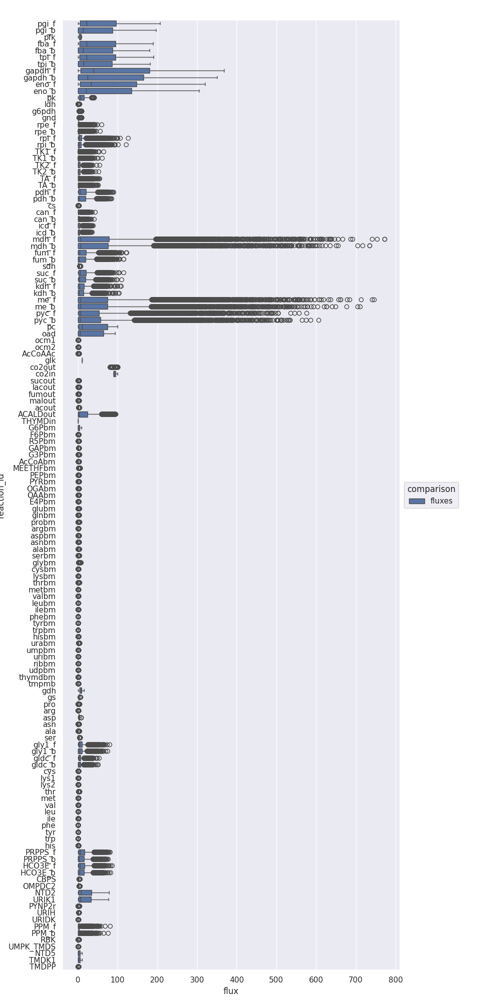

In [8]:
fig = plot_fluxes(
    sns.boxplot,
    fluxes=df_fluxes,
    figsize=(10, 20)
)
fig.subplots_adjust(top=0.98, bottom=0.03)

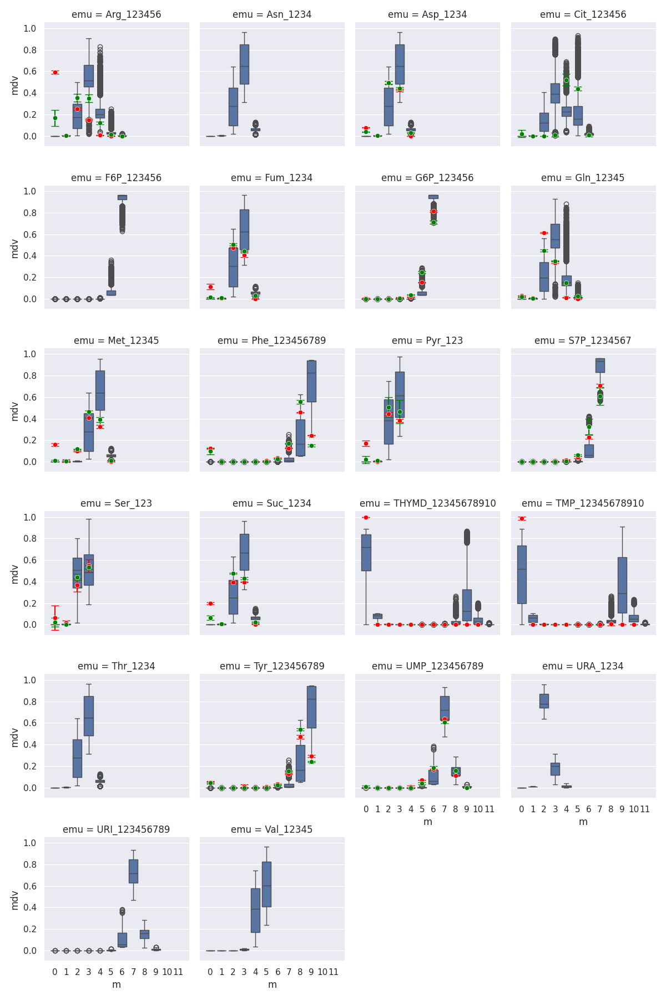

In [8]:
fg = (
    df_mdvs
    .pipe(plot_mdvs_boxplots)
    .pipe(add_exp_points, df_exp.query("medium == 'Thymidine'"))
    .pipe(add_exp_points, df_exp.query("medium == 'Glucose'"), color="green")
)

In [9]:
def add_noise(data, noise_scale=0.01, seed=42):
    rng = np.random.default_rng(seed)
    new_data = (data + rng.uniform(-noise_scale, noise_scale, size=data.shape)).abs()
    return new_data / new_data.sum(axis=0)

In [10]:
df_mdvs_with_noise = (
    df_mdvs
    .reset_index(names="isotopo")
    .pipe(lambda x: x.join(x.isotopo.str.extract("(?P<mb>.*)_.*_.*")))
    .set_index("isotopo")
    .groupby("mb")
    .transform(add_noise)
)

In [11]:
df_exp_w_noise = pd.concat([
    g.assign(mdv=add_noise(g.mdv))
    for idx, g in
    df_exp
    .groupby(["strain", "medium", "emu"], as_index=False)
], ignore_index=True)

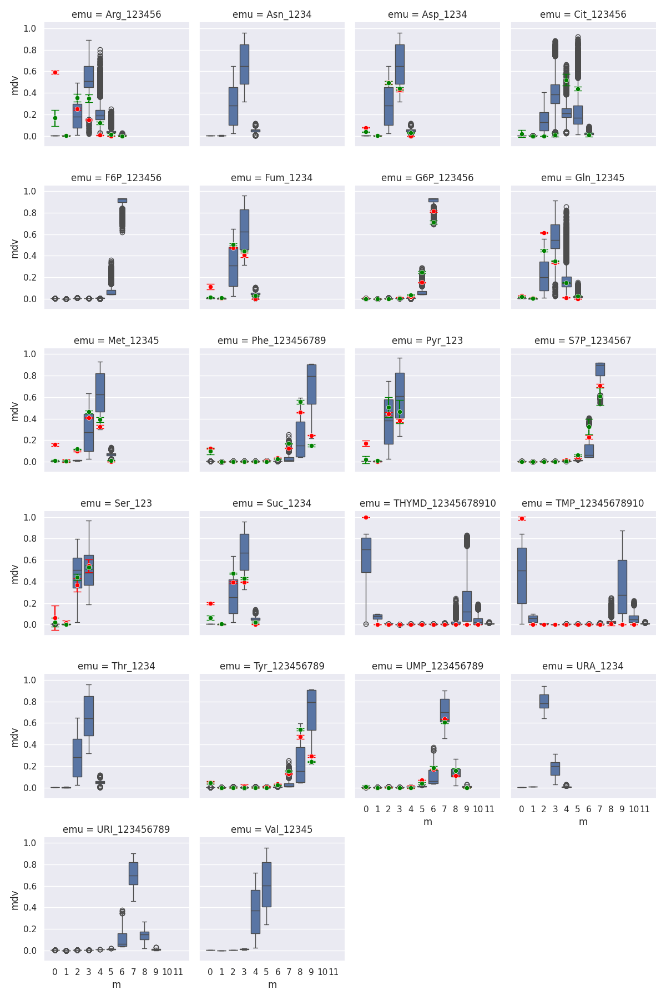

In [12]:
fg = (
    df_mdvs_with_noise
    .pipe(plot_mdvs_boxplots)
    .pipe(add_exp_points, df_exp.query("medium == 'Thymidine'"))
    .pipe(add_exp_points, df_exp.query("medium == 'Glucose'"), color="green")
)

## Additional plots

In [13]:
df_tmp = pd.DataFrame(dict(
    THYMD_12345678910_0=
        # pd.concat([df_mdvs1, df_mdvs2], axis=1, ignore_index=True)
        df_mdvs
        .loc["THYMD_12345678910_0"].reset_index(drop=True), 
    THYMD_uptake=
        # pd.concat([df_fluxes1, df_fluxes2], axis=1, ignore_index=True)
        df_fluxes
        .pipe(lambda x: x.loc["THYMDin"] / (x.loc["NTD5"] + x.loc["THYMDin"]))
        .reset_index(drop=True),
    THYMDin=
        # pd.concat([df_fluxes1, df_fluxes2], axis=1, ignore_index=True)
        df_fluxes
        .loc["THYMDin"]
))
df_tmp

,THYMD_12345678910_0,THYMD_uptake,THYMDin
0,0.841436,0.183473,0.381960
1,0.815517,0.477038,0.745683
2,0.810168,0.283534,0.959737
3,0.845026,0.392796,0.947135
4,0.766628,0.293816,0.961016
...,...,...,...
10995,0.888399,1.000000,0.468099
10996,0.888399,1.000000,0.673479
10997,0.888399,1.000000,0.725264
10998,0.888399,1.000000,0.343878


<Axes: xlabel='THYMDin', ylabel='NTD5'>

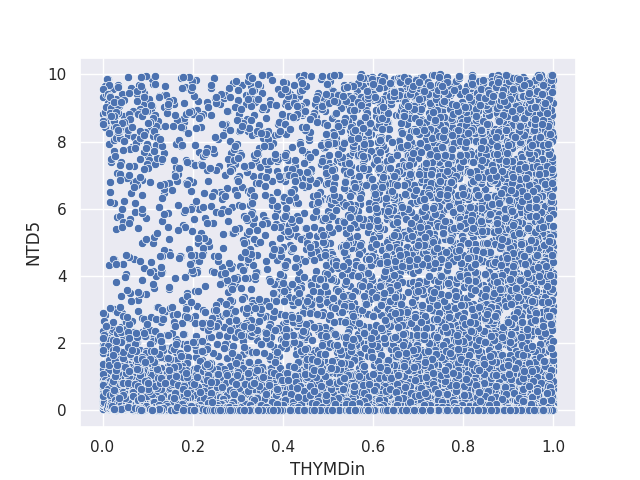

In [14]:
fig, ax = plt.subplots()
sns.scatterplot(df_fluxes.transpose(), x="THYMDin", y="NTD5")

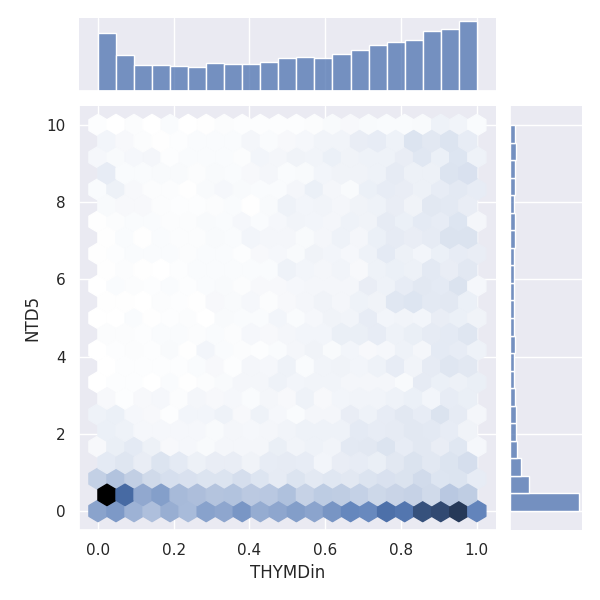

In [15]:
# fig, ax = plt.subplots()
sns.jointplot(df_fluxes.transpose(), x="THYMDin", y="NTD5", kind="hex")

<Axes: xlabel='THYMD_uptake', ylabel='THYMD_12345678910_0'>

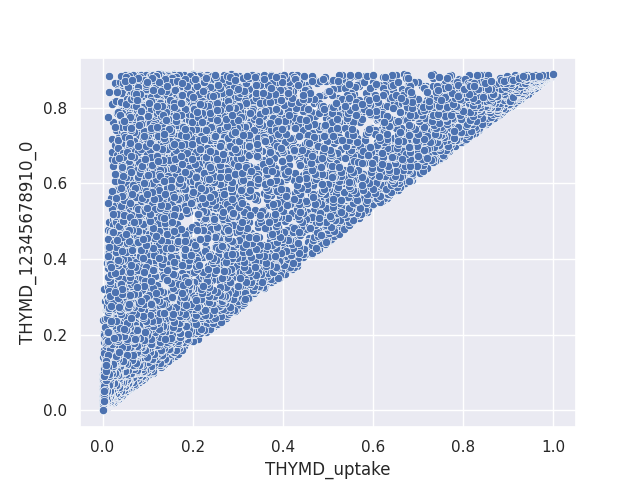

In [16]:
fig, ax = plt.subplots()
sns.scatterplot(df_tmp, x="THYMD_uptake", y="THYMD_12345678910_0")

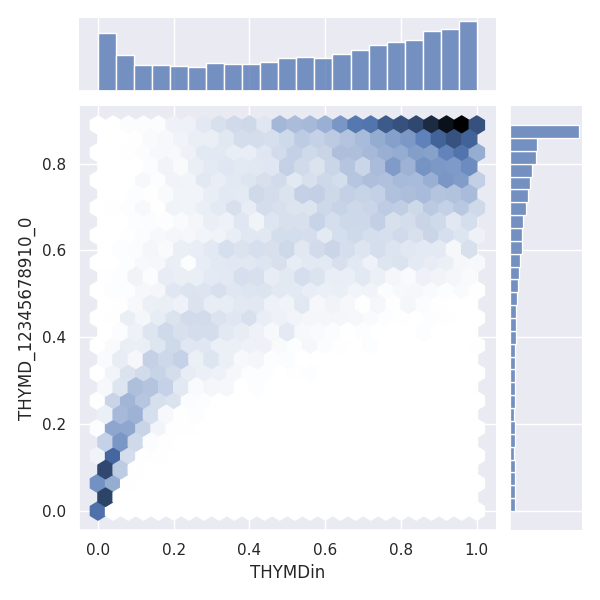

In [17]:
sns.jointplot(df_tmp, x="THYMDin", y="THYMD_12345678910_0", kind="hex")

# RF models

## Full

Full RF model on all features in the given nucleoside condition

In [18]:
isotopo_list_full = get_features_list(df_mdvs_with_noise, df_exp, "Thymidine")
df_exp_full = df_exp_w_noise.pipe(get_features_from_exp, "Thymidine", isotopo_list_full)
df_exp_full_glucose = df_exp_w_noise.pipe(get_features_from_exp, "Glucose", isotopo_list_full)
df_mdvs_full = df_mdvs_with_noise.reindex(isotopo_list_full)

In [19]:
res_full, df_feat_imp_full = train_rf_for_all_flux_ratios(df_fluxes, df_mdvs_full, thymd_flux_ratios_dict)

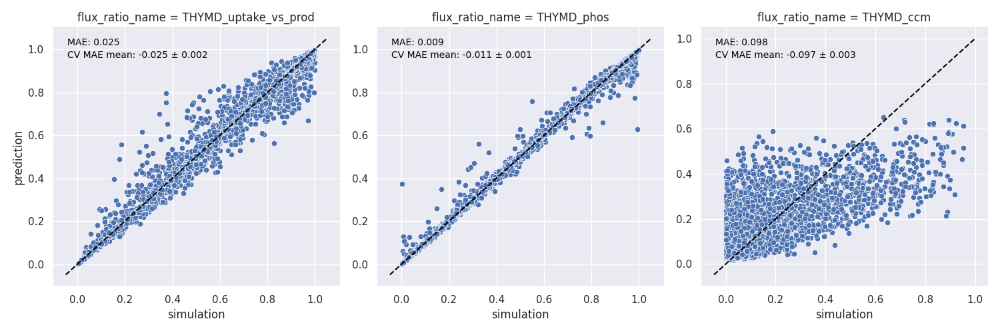

In [20]:
fg = plot_rf_results(res_full, col_wrap=3)

In [21]:
df_pred_full = (
    pd.concat([
        get_rf_pred_results(res_full, df_exp_full, "Thymidine"),
        get_rf_pred_results(res_full, df_exp_full_glucose, "Glucose")
    ], ignore_index=True)
    .assign(comparison="full")
)

df_pred_full

,condition,flux_ratio,pred,pred_q10,pred_q90,mae,cv_mae_mean,cv_mae_sd,nucleoside,flux_ratio_name,comparison
0,Thymidine,THYMD_uptake_vs_prod,0.8745,0.711591,0.993382,0.025255,-0.025152,0.001504,THYMD_uptake_vs,prod,full
1,Thymidine,THYMD_phos,0.92251,0.726598,0.996689,0.009438,-0.010948,0.000526,THYMD,phos,full
2,Thymidine,THYMD_ccm,0.248572,0.025877,0.493052,0.097781,-0.097229,0.002577,THYMD,ccm,full
3,Glucose,THYMD_uptake_vs_prod,NaN,NaN,NaN,0.025255,-0.025152,0.001504,THYMD_uptake_vs,prod,full
4,Glucose,THYMD_phos,NaN,NaN,NaN,0.009438,-0.010948,0.000526,THYMD,phos,full
5,Glucose,THYMD_ccm,NaN,NaN,NaN,0.097781,-0.097229,0.002577,THYMD,ccm,full


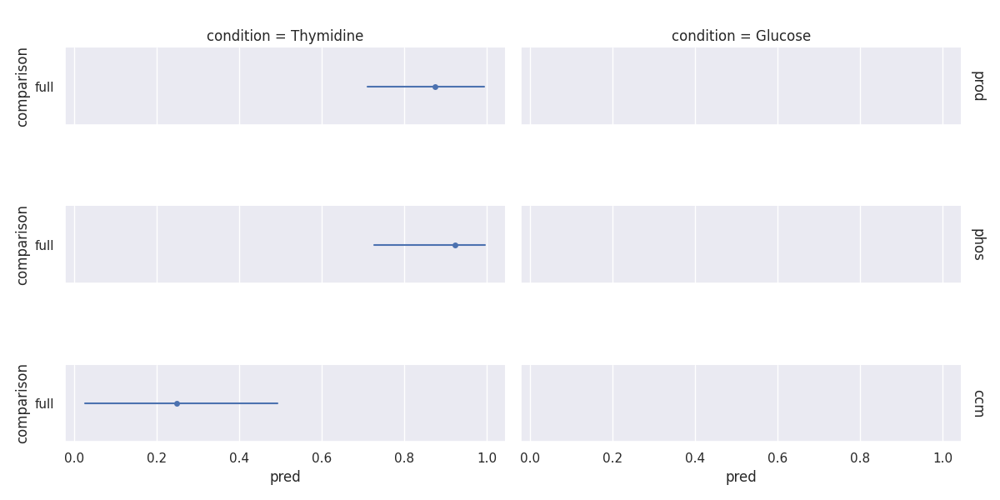

In [22]:
fg = (
    sns.FacetGrid(
        df_pred_full,
        row="flux_ratio_name",
        col="condition",
        aspect=3,
        height=2,
        margin_titles=True
    )
    .map_dataframe(lineplots, y="comparison")
    .set_titles(row_template="{row_name}")
)
fg

In [23]:
df_feat_imp_full

,feature,importance,ratio_name
76,THYMD_12345678910_9,0.734753,THYMD_uptake_vs_prod
88,TMP_12345678910_10,0.087119,THYMD_uptake_vs_prod
67,THYMD_12345678910_0,0.046703,THYMD_uptake_vs_prod
68,THYMD_12345678910_1,0.032267,THYMD_uptake_vs_prod
69,THYMD_12345678910_2,0.027286,THYMD_uptake_vs_prod
...,...,...,...
36,Phe_123456789_0,0.000255,THYMD_ccm
38,Phe_123456789_2,0.000244,THYMD_ccm
37,Phe_123456789_1,0.000228,THYMD_ccm
90,Tyr_123456789_1,0.000214,THYMD_ccm


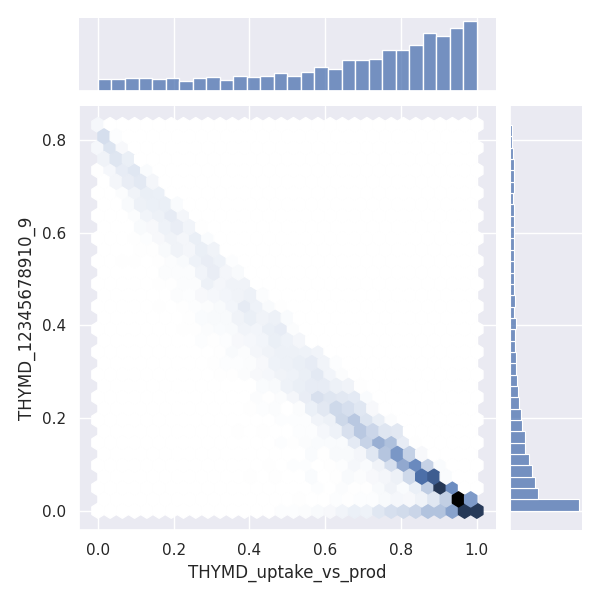

In [24]:
# fig, ax = plt.subplots()
df_tmp = pd.DataFrame(dict(
    THYMD_12345678910_9 = df_mdvs_full.loc["THYMD_12345678910_9"], 
    THYMD_uptake = df_fluxes.pipe(lambda x: x.loc["THYMDin"] / (x.loc["THYMDin"] + x.loc["UMPK_TMDS"]))
))
sns.jointplot(df_tmp, x="THYMD_uptake", y="THYMD_12345678910_9", kind="hex")

## Without nucleoside

RF model on all features in the given nucleoside condition without nucleoside itself

In [25]:
isotopo_list_wo_nuc = get_features_list(df_mdvs_with_noise, df_exp.query("~isotopo.str.startswith('THYMD')"), "Thymidine")
df_exp_wo_nuc = df_exp_w_noise.pipe(get_features_from_exp, "Thymidine", isotopo_list_wo_nuc)
df_exp_wo_nuc_glucose = df_exp_w_noise.pipe(get_features_from_exp, "Glucose", isotopo_list_wo_nuc)
df_mdvs_wo_nuc = df_mdvs_with_noise.reindex(isotopo_list_wo_nuc)

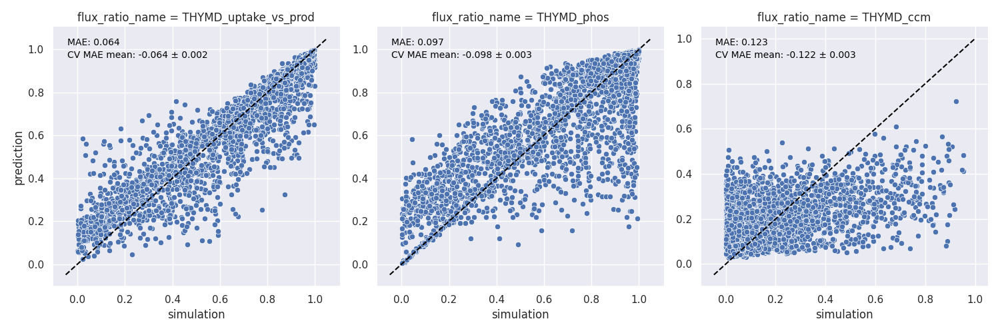

In [26]:
res_wo_nuc, df_feat_imp_wo_nuc = train_rf_for_all_flux_ratios(df_fluxes, df_mdvs_wo_nuc, thymd_flux_ratios_dict)
fg = plot_rf_results(res_wo_nuc, col_wrap=3)

In [27]:
df_pred_wo_nuc = (
    pd.concat([
        get_rf_pred_results(res_wo_nuc, df_exp_wo_nuc, "Thymidine"),
        get_rf_pred_results(res_wo_nuc, df_exp_wo_nuc_glucose, "Glucose")
    ], ignore_index=True)
    .assign(comparison="wo nuc")
)

df_pred_full

,condition,flux_ratio,pred,pred_q10,pred_q90,mae,cv_mae_mean,cv_mae_sd,nucleoside,flux_ratio_name,comparison
0,Thymidine,THYMD_uptake_vs_prod,0.8745,0.711591,0.993382,0.025255,-0.025152,0.001504,THYMD_uptake_vs,prod,full
1,Thymidine,THYMD_phos,0.92251,0.726598,0.996689,0.009438,-0.010948,0.000526,THYMD,phos,full
2,Thymidine,THYMD_ccm,0.248572,0.025877,0.493052,0.097781,-0.097229,0.002577,THYMD,ccm,full
3,Glucose,THYMD_uptake_vs_prod,NaN,NaN,NaN,0.025255,-0.025152,0.001504,THYMD_uptake_vs,prod,full
4,Glucose,THYMD_phos,NaN,NaN,NaN,0.009438,-0.010948,0.000526,THYMD,phos,full
5,Glucose,THYMD_ccm,NaN,NaN,NaN,0.097781,-0.097229,0.002577,THYMD,ccm,full


In [28]:
df_exp_wo_nuc.pipe(check_mdv_nan), df_exp_wo_nuc_glucose.pipe(check_mdv_nan)

([], ['TMP'])

## Glucose features 

RF model on all features in GLC condition

In [29]:
isotopo_list_glc = get_features_list(df_mdvs_with_noise, df_exp, "Glucose")
df_exp_glc = df_exp_w_noise.pipe(get_features_from_exp, "Thymidine", isotopo_list_glc)
df_exp_glc_glucose = df_exp_w_noise.pipe(get_features_from_exp, "Glucose", isotopo_list_glc)
df_mdvs_glc = df_mdvs_with_noise.reindex(isotopo_list_glc)

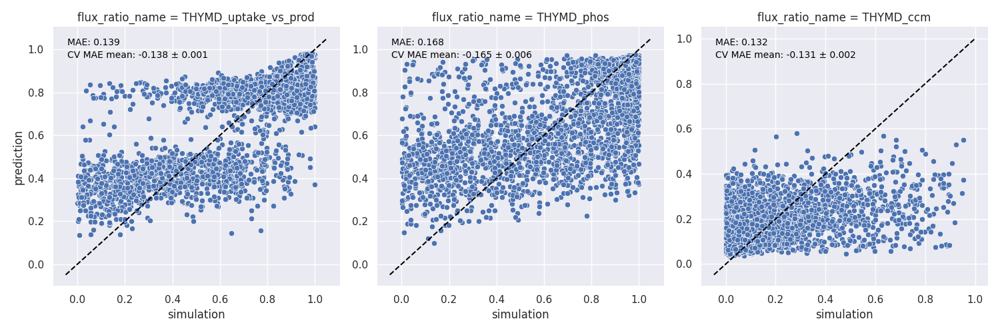

In [30]:
res_glc, df_feat_imp_glc = train_rf_for_all_flux_ratios(df_fluxes, df_mdvs_glc, thymd_flux_ratios_dict)
fg = plot_rf_results(res_glc, col_wrap=3)

In [31]:
df_pred_glc = (
    pd.concat([
        get_rf_pred_results(res_glc, df_exp_glc, "Thymidine"),
        get_rf_pred_results(res_glc, df_exp_glc_glucose, "Glucose")
    ], ignore_index=True)
    .assign(comparison="glc")
)

df_pred_glc

,condition,flux_ratio,pred,pred_q10,pred_q90,mae,cv_mae_mean,cv_mae_sd,nucleoside,flux_ratio_name,comparison
0,Thymidine,THYMD_uptake_vs_prod,NaN,NaN,NaN,0.139440,-0.138106,0.000997,THYMD_uptake_vs,prod,glc
1,Thymidine,THYMD_phos,NaN,NaN,NaN,0.167895,-0.164949,0.006440,THYMD,phos,glc
2,Thymidine,THYMD_ccm,NaN,NaN,NaN,0.131784,-0.131065,0.002124,THYMD,ccm,glc
3,Glucose,THYMD_uptake_vs_prod,0.739409,0.35424,0.950338,0.139440,-0.138106,0.000997,THYMD_uptake_vs,prod,glc
4,Glucose,THYMD_phos,0.682688,0.324292,0.98074,0.167895,-0.164949,0.006440,THYMD,phos,glc
5,Glucose,THYMD_ccm,0.318456,0.022096,0.666554,0.131784,-0.131065,0.002124,THYMD,ccm,glc


In [32]:
df_exp_glc.pipe(check_mdv_nan), df_exp_glc_glucose.pipe(check_mdv_nan)

(['Cit'], [])

## Both features

RF model on all features detected in both the given nucleoside condition and GLC condition

In [33]:
isotopo_list_both = list(set(isotopo_list_wo_nuc).intersection(isotopo_list_glc))
df_exp_both = df_exp_w_noise.pipe(get_features_from_exp, "Thymidine", isotopo_list_both)
df_exp_both_glucose = df_exp_w_noise.pipe(get_features_from_exp, "Glucose", isotopo_list_both)
df_mdvs_both = df_mdvs_with_noise.reindex(isotopo_list_both)

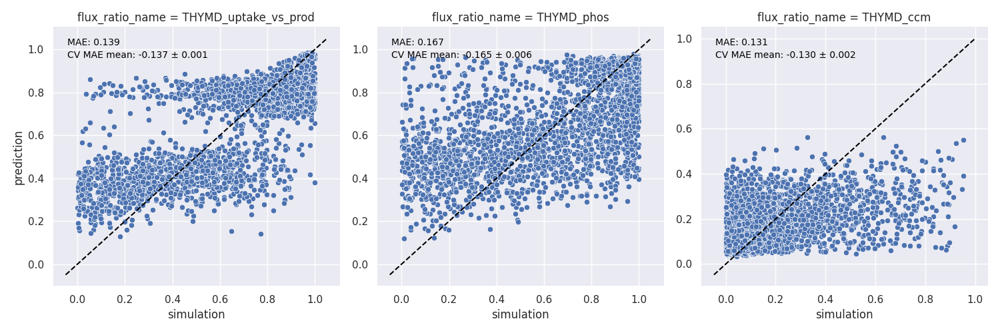

In [34]:
res_both, df_feat_imp_both = train_rf_for_all_flux_ratios(df_fluxes, df_mdvs_both, thymd_flux_ratios_dict)
fg = plot_rf_results(res_both, col_wrap=3)

In [35]:
df_pred_both = (
    pd.concat([
        get_rf_pred_results(res_both, df_exp_both, "Thymidine"),
        get_rf_pred_results(res_both, df_exp_both_glucose, "Glucose")
    ], ignore_index=True)
    .assign(comparison="both")
)

df_pred_both

,condition,flux_ratio,pred,pred_q10,pred_q90,mae,cv_mae_mean,cv_mae_sd,nucleoside,flux_ratio_name,comparison
0,Thymidine,THYMD_uptake_vs_prod,0.928648,0.859564,0.982068,0.138979,-0.137139,0.001277,THYMD_uptake_vs,prod,both
1,Thymidine,THYMD_phos,0.616378,0.192411,0.975491,0.167270,-0.164508,0.006475,THYMD,phos,both
2,Thymidine,THYMD_ccm,0.451097,0.067741,0.728097,0.131483,-0.130332,0.002487,THYMD,ccm,both
3,Glucose,THYMD_uptake_vs_prod,0.705945,0.263796,0.961578,0.138979,-0.137139,0.001277,THYMD_uptake_vs,prod,both
4,Glucose,THYMD_phos,0.652428,0.295097,0.981693,0.167270,-0.164508,0.006475,THYMD,phos,both
5,Glucose,THYMD_ccm,0.392816,0.058999,0.706832,0.131483,-0.130332,0.002487,THYMD,ccm,both


In [36]:
df_exp_both.pipe(check_mdv_nan), df_exp_both_glucose.pipe(check_mdv_nan)

([], [])

In [37]:
df_pred_all = pd.concat([
    df_pred_full, df_pred_wo_nuc, df_pred_glc, df_pred_both
], ignore_index=True)
df_pred_all

,condition,flux_ratio,pred,pred_q10,pred_q90,mae,cv_mae_mean,cv_mae_sd,nucleoside,flux_ratio_name,comparison
0,Thymidine,THYMD_uptake_vs_prod,0.8745,0.711591,0.993382,0.025255,-0.025152,0.001504,THYMD_uptake_vs,prod,full
1,Thymidine,THYMD_phos,0.92251,0.726598,0.996689,0.009438,-0.010948,0.000526,THYMD,phos,full
2,Thymidine,THYMD_ccm,0.248572,0.025877,0.493052,0.097781,-0.097229,0.002577,THYMD,ccm,full
3,Glucose,THYMD_uptake_vs_prod,NaN,NaN,NaN,0.025255,-0.025152,0.001504,THYMD_uptake_vs,prod,full
4,Glucose,THYMD_phos,NaN,NaN,NaN,0.009438,-0.010948,0.000526,THYMD,phos,full
5,Glucose,THYMD_ccm,NaN,NaN,NaN,0.097781,-0.097229,0.002577,THYMD,ccm,full
6,Thymidine,THYMD_uptake_vs_prod,0.964954,0.918634,0.99715,0.063879,-0.063899,0.001690,THYMD_uptake_vs,prod,wo nuc
7,Thymidine,THYMD_phos,0.958376,0.900686,0.995653,0.097369,-0.097527,0.002953,THYMD,phos,wo nuc
8,Thymidine,THYMD_ccm,0.317778,0.031176,0.655975,0.123324,-0.122129,0.002866,THYMD,ccm,wo nuc
9,Glucose,THYMD_uptake_vs_prod,NaN,NaN,NaN,0.063879,-0.063899,0.001690,THYMD_uptake_vs,prod,wo nuc


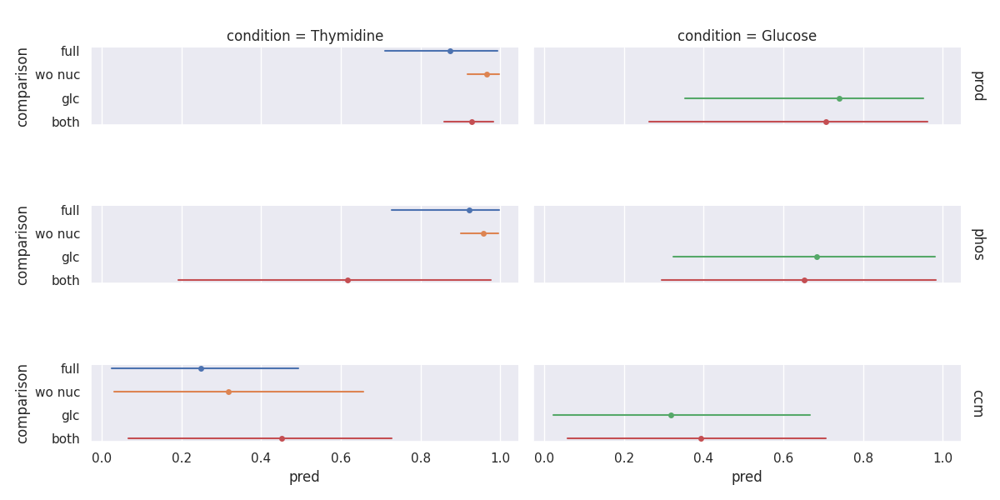

In [38]:
fg = (
    sns.FacetGrid(
        df_pred_all,
        row="flux_ratio_name",
        col="condition",
        aspect=3,
        height=2,
        margin_titles=True
    )
    .map_dataframe(lineplots, y="comparison")
    .set_titles(row_template="{row_name}")
)
fg

In [39]:
df_feat_imp_full.query("ratio_name == 'THYMD_uptake'").head(20)

,feature,importance,ratio_name
76,THYMD_12345678910_9,0.734753,THYMD_uptake_vs_prod
88,TMP_12345678910_10,0.087119,THYMD_uptake_vs_prod
67,THYMD_12345678910_0,0.046703,THYMD_uptake_vs_prod
68,THYMD_12345678910_1,0.032267,THYMD_uptake_vs_prod
69,THYMD_12345678910_2,0.027286,THYMD_uptake_vs_prod
70,THYMD_12345678910_3,0.023558,THYMD_uptake_vs_prod
71,THYMD_12345678910_4,0.010145,THYMD_uptake_vs_prod
103,UMP_123456789_4,0.003206,THYMD_uptake_vs_prod
79,TMP_12345678910_1,0.001782,THYMD_uptake_vs_prod
87,TMP_12345678910_9,0.001725,THYMD_uptake_vs_prod


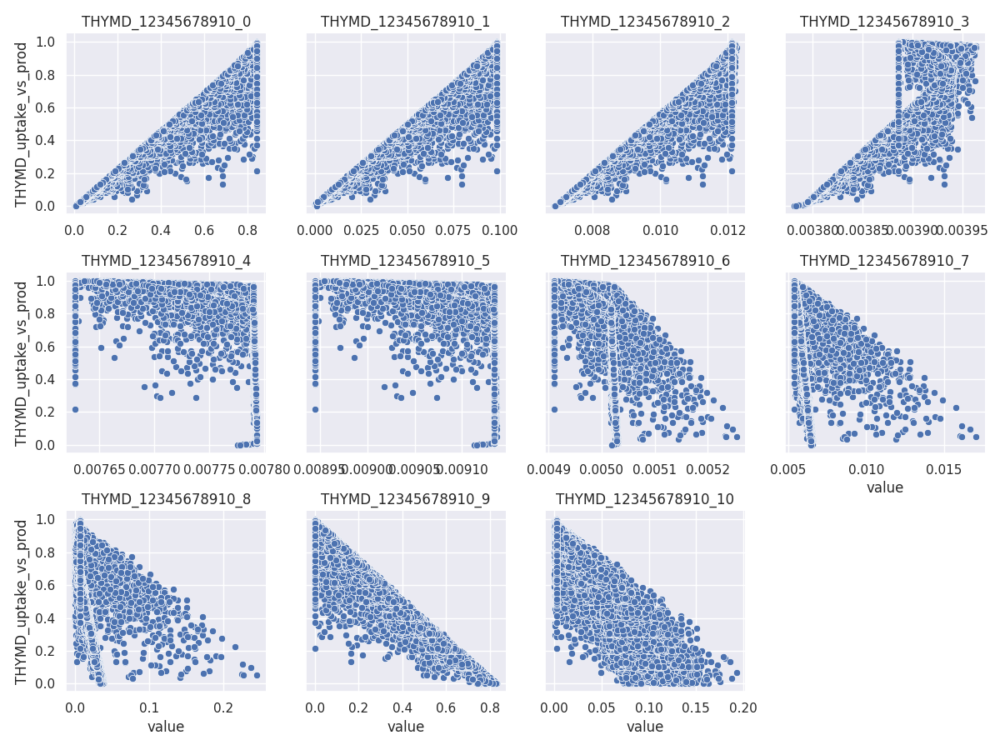

In [40]:
df_tmp = (
    df_mdvs_full
    .reset_index(names="isotopo")
    .query("isotopo.str.startswith('THYMD')")
    .set_index("isotopo")
    .transpose()
    .melt(ignore_index=False)
    .join(
        (df_fluxes.loc["THYMDin"] / (df_fluxes.loc["UMPK_TMDS"] + df_fluxes.loc["THYMDin"])).to_frame(name="THYMD_uptake")
    )
)

fg = (
    sns.FacetGrid(
        df_tmp,
        col="isotopo",
        col_wrap=4,
        sharex=False
    )
    .map_dataframe(
        sns.scatterplot,
        x="value",
        y="THYMD_uptake"
    )
    .set_titles(col_template="{col_name}")
)

# Feature removal

In [41]:
df_mdvs_with_noise_sel = (
    df_mdvs_with_noise[(df_mdvs_with_noise > 0.05).any(axis=1)]
    .query("index != 'THYMD_12345678910_8'")
)
df_mdvs_with_noise_sel

,0,1,2,3,4,5,6,7,8,9,...,10990,10991,10992,10993,10994,10995,10996,10997,10998,10999
isotopo,,,,,,,,,,,,,,,,,,,,,
Arg_123456_2,0.306954,0.316778,0.417765,0.141171,0.295212,0.292035,0.321071,0.218124,0.420821,0.160831,...,0.426465,0.382750,0.292585,0.241255,0.344997,0.319842,0.338355,0.353094,0.146898,0.266989
Arg_123456_3,0.506348,0.503864,0.435738,0.626795,0.517603,0.525753,0.465467,0.534477,0.434479,0.597115,...,0.418468,0.458000,0.497777,0.555169,0.470571,0.445524,0.481882,0.452977,0.354014,0.424314
Arg_123456_4,0.146447,0.140324,0.110030,0.189354,0.147454,0.143262,0.165840,0.197332,0.108453,0.195426,...,0.115604,0.121583,0.164217,0.162282,0.141974,0.180081,0.139480,0.148885,0.371164,0.230792
Arg_123456_5,0.026726,0.025460,0.021803,0.031038,0.026383,0.025664,0.033465,0.037047,0.021556,0.034496,...,0.024481,0.023363,0.031734,0.028495,0.028289,0.039881,0.026366,0.030617,0.109339,0.061661
Asn_1234_2,0.202171,0.204986,0.170277,0.166584,0.279329,0.359894,0.244927,0.165209,0.381782,0.217414,...,0.580321,0.452222,0.433080,0.325207,0.450392,0.413809,0.375667,0.492114,0.469261,0.508396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
URI_123456789_6,0.119751,0.060036,0.050018,0.057768,0.142795,0.046185,0.105182,0.096613,0.088439,0.084062,...,0.035918,0.091811,0.107681,0.139788,0.102057,0.067220,0.102984,0.121576,0.044191,0.076659
URI_123456789_7,0.681560,0.739205,0.743646,0.739999,0.676395,0.687937,0.691129,0.702853,0.705699,0.701721,...,0.696045,0.711433,0.672758,0.646049,0.661181,0.699855,0.686418,0.659179,0.685919,0.639561
URI_123456789_8,0.152305,0.156904,0.162290,0.158420,0.135446,0.216244,0.157382,0.155012,0.160142,0.168168,...,0.217116,0.151900,0.171160,0.165424,0.186800,0.184908,0.163547,0.170058,0.217141,0.226567


## Full

Full RF model on all features in the given nucleoside condition

In [42]:
isotopo_list_full_sel = get_features_list(df_mdvs_with_noise_sel, df_exp, "Thymidine")
df_exp_full_sel = df_exp_w_noise.pipe(get_features_from_exp, "Thymidine", isotopo_list_full_sel)
df_exp_full_sel_glucose = df_exp_w_noise.pipe(get_features_from_exp, "Glucose", isotopo_list_full_sel)
df_mdvs_full_sel = df_mdvs_with_noise_sel.reindex(isotopo_list_full_sel)

In [43]:
res_full_sel, df_feat_imp_full_sel = train_rf_for_all_flux_ratios(df_fluxes, df_mdvs_full_sel, thymd_flux_ratios_dict)

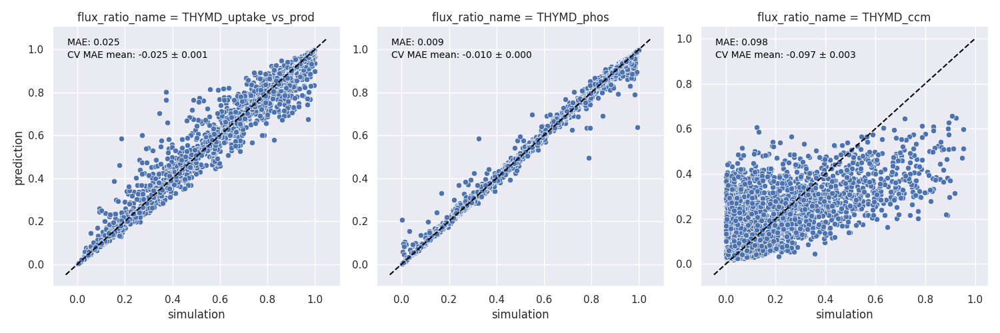

In [44]:
fg = plot_rf_results(res_full_sel, col_wrap=3)

In [45]:
df_pred_full_sel = (
    pd.concat([
        get_rf_pred_results(res_full_sel, df_exp_full_sel, "Thymidine"),
        get_rf_pred_results(res_full_sel, df_exp_full_sel_glucose, "Glucose")
    ], ignore_index=True)
    .assign(comparison="full_sel")
)

df_pred_full_sel

,condition,flux_ratio,pred,pred_q10,pred_q90,mae,cv_mae_mean,cv_mae_sd,nucleoside,flux_ratio_name,comparison
0,Thymidine,THYMD_uptake_vs_prod,0.949344,0.894054,0.995019,0.025263,-0.024950,0.001465,THYMD_uptake_vs,prod,full_sel
1,Thymidine,THYMD_phos,0.97609,0.924164,0.999162,0.008825,-0.010462,0.000452,THYMD,phos,full_sel
2,Thymidine,THYMD_ccm,0.216027,0.024056,0.52681,0.097670,-0.097014,0.002614,THYMD,ccm,full_sel
3,Glucose,THYMD_uptake_vs_prod,NaN,NaN,NaN,0.025263,-0.024950,0.001465,THYMD_uptake_vs,prod,full_sel
4,Glucose,THYMD_phos,NaN,NaN,NaN,0.008825,-0.010462,0.000452,THYMD,phos,full_sel
5,Glucose,THYMD_ccm,NaN,NaN,NaN,0.097670,-0.097014,0.002614,THYMD,ccm,full_sel


In [46]:
def check_mdv_nan(data):
    return (
        data
        .query("mdv.isna()")
        .index.str.extract("(.*)_.*_.*")
        .drop_duplicates()
        .iloc[:, 0]
        .tolist()
    )

In [47]:
df_exp_full_sel.pipe(check_mdv_nan), df_exp_full_sel_glucose.pipe(check_mdv_nan)

([], ['THYMD', 'TMP'])

## Without nucleoside

RF model on all features in the given nucleoside condition without nucleoside itself

In [48]:
isotopo_list_wo_nuc_sel = get_features_list(df_mdvs_with_noise_sel, df_exp.query("~isotopo.str.startswith('THYMD')"), "Thymidine")
df_exp_wo_nuc_sel = df_exp_w_noise.pipe(get_features_from_exp, "Thymidine", isotopo_list_wo_nuc_sel)
df_exp_wo_nuc_sel_glucose = df_exp_w_noise.pipe(get_features_from_exp, "Glucose", isotopo_list_wo_nuc_sel)
df_mdvs_wo_nuc_sel = df_mdvs_with_noise_sel.reindex(isotopo_list_wo_nuc_sel)

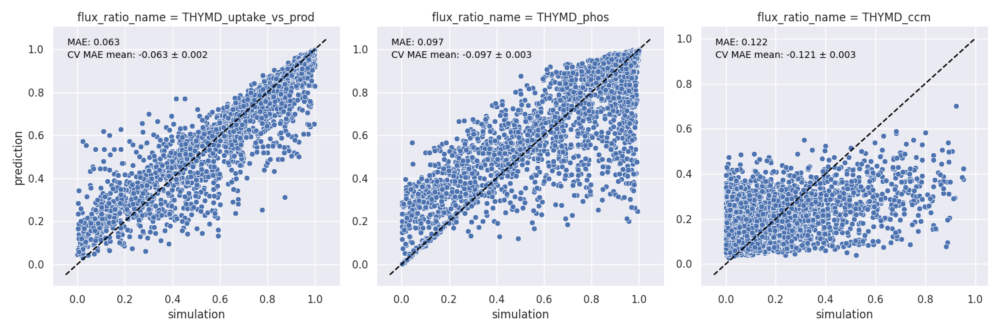

In [49]:
res_wo_nuc_sel, df_feat_imp_wo_nuc_sel = train_rf_for_all_flux_ratios(df_fluxes, df_mdvs_wo_nuc_sel, thymd_flux_ratios_dict)
fg = plot_rf_results(res_wo_nuc_sel, col_wrap=3)

In [50]:
df_pred_wo_nuc_sel = (
    pd.concat([
        get_rf_pred_results(res_wo_nuc_sel, df_exp_wo_nuc_sel, "Thymidine"),
        get_rf_pred_results(res_wo_nuc_sel, df_exp_wo_nuc_sel_glucose, "Glucose")
    ], ignore_index=True)
    .assign(comparison="wo nuc sel")
)

df_pred_full_sel

,condition,flux_ratio,pred,pred_q10,pred_q90,mae,cv_mae_mean,cv_mae_sd,nucleoside,flux_ratio_name,comparison
0,Thymidine,THYMD_uptake_vs_prod,0.949344,0.894054,0.995019,0.025263,-0.024950,0.001465,THYMD_uptake_vs,prod,full_sel
1,Thymidine,THYMD_phos,0.97609,0.924164,0.999162,0.008825,-0.010462,0.000452,THYMD,phos,full_sel
2,Thymidine,THYMD_ccm,0.216027,0.024056,0.52681,0.097670,-0.097014,0.002614,THYMD,ccm,full_sel
3,Glucose,THYMD_uptake_vs_prod,NaN,NaN,NaN,0.025263,-0.024950,0.001465,THYMD_uptake_vs,prod,full_sel
4,Glucose,THYMD_phos,NaN,NaN,NaN,0.008825,-0.010462,0.000452,THYMD,phos,full_sel
5,Glucose,THYMD_ccm,NaN,NaN,NaN,0.097670,-0.097014,0.002614,THYMD,ccm,full_sel


In [51]:
df_exp_wo_nuc_sel.pipe(check_mdv_nan), df_exp_wo_nuc_sel_glucose.pipe(check_mdv_nan)

([], ['TMP'])

## Glucose features 

RF model on all features in GLC condition

In [52]:
isotopo_list_glc_sel = get_features_list(df_mdvs_with_noise_sel, df_exp, "Glucose")
df_exp_glc_sel = df_exp_w_noise.pipe(get_features_from_exp, "Thymidine", isotopo_list_glc_sel)
df_exp_glc_sel_glucose = df_exp_w_noise.pipe(get_features_from_exp, "Glucose", isotopo_list_glc_sel)
df_mdvs_glc_sel = df_mdvs_with_noise_sel.reindex(isotopo_list_glc_sel)

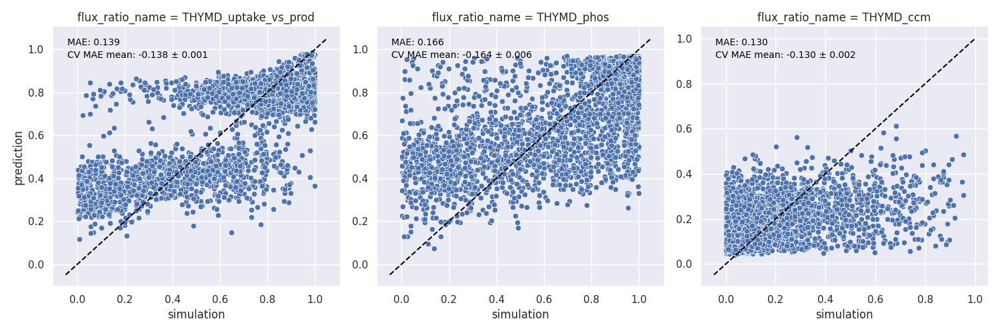

In [53]:
res_glc_sel, df_feat_imp_glc_sel = train_rf_for_all_flux_ratios(df_fluxes, df_mdvs_glc_sel, thymd_flux_ratios_dict)
fg = plot_rf_results(res_glc_sel, col_wrap=3)

In [54]:
df_pred_glc_sel = (
    pd.concat([
        get_rf_pred_results(res_glc_sel, df_exp_glc_sel, "Thymidine"),
        get_rf_pred_results(res_glc_sel, df_exp_glc_sel_glucose, "Glucose")
    ], ignore_index=True)
    .assign(comparison="glc_sel")
)

df_pred_glc_sel

,condition,flux_ratio,pred,pred_q10,pred_q90,mae,cv_mae_mean,cv_mae_sd,nucleoside,flux_ratio_name,comparison
0,Thymidine,THYMD_uptake_vs_prod,NaN,NaN,NaN,0.138768,-0.137777,0.001405,THYMD_uptake_vs,prod,glc_sel
1,Thymidine,THYMD_phos,NaN,NaN,NaN,0.165916,-0.163992,0.006307,THYMD,phos,glc_sel
2,Thymidine,THYMD_ccm,NaN,NaN,NaN,0.130280,-0.130372,0.002307,THYMD,ccm,glc_sel
3,Glucose,THYMD_uptake_vs_prod,0.761118,0.479518,0.964701,0.138768,-0.137777,0.001405,THYMD_uptake_vs,prod,glc_sel
4,Glucose,THYMD_phos,0.785635,0.451564,0.985051,0.165916,-0.163992,0.006307,THYMD,phos,glc_sel
5,Glucose,THYMD_ccm,0.275819,0.015882,0.665427,0.130280,-0.130372,0.002307,THYMD,ccm,glc_sel


In [55]:
df_exp_glc_sel.pipe(check_mdv_nan), df_exp_glc_sel_glucose.pipe(check_mdv_nan)

(['Cit'], [])

## Both features

RF model on all features detected in both the given nucleoside condition and GLC condition

In [56]:
isotopo_list_both_sel = list(set(isotopo_list_wo_nuc_sel).intersection(isotopo_list_glc_sel))
df_exp_both_sel = df_exp_w_noise.pipe(get_features_from_exp, "Thymidine", isotopo_list_both_sel)
df_exp_both_sel_glucose = df_exp_w_noise.pipe(get_features_from_exp, "Glucose", isotopo_list_both_sel)
df_mdvs_both_sel = df_mdvs_with_noise_sel.reindex(isotopo_list_both_sel)

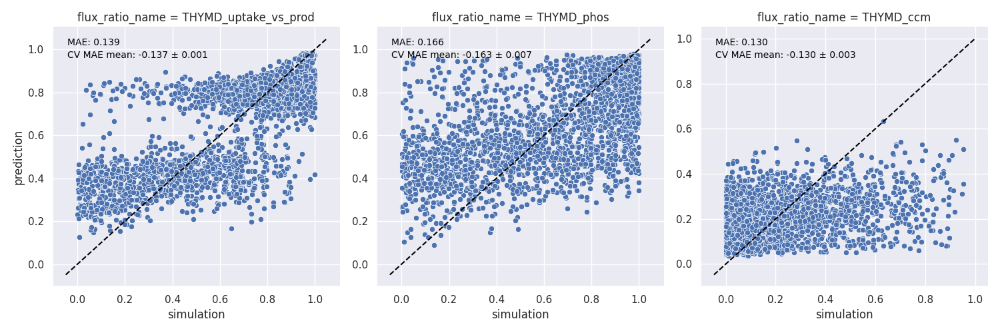

In [57]:
res_both_sel, df_feat_imp_both_sel = train_rf_for_all_flux_ratios(df_fluxes, df_mdvs_both_sel, thymd_flux_ratios_dict)
fg = plot_rf_results(res_both_sel, col_wrap=3)

In [58]:
df_pred_both_sel = (
    pd.concat([
        get_rf_pred_results(res_both_sel, df_exp_both_sel, "Thymidine"),
        get_rf_pred_results(res_both_sel, df_exp_both_sel_glucose, "Glucose")
    ], ignore_index=True)
    .assign(comparison="both_sel")
)

df_pred_both_sel

,condition,flux_ratio,pred,pred_q10,pred_q90,mae,cv_mae_mean,cv_mae_sd,nucleoside,flux_ratio_name,comparison
0,Thymidine,THYMD_uptake_vs_prod,0.925289,0.859564,0.980334,0.138521,-0.136983,0.000994,THYMD_uptake_vs,prod,both_sel
1,Thymidine,THYMD_phos,0.747779,0.4527,0.976661,0.165591,-0.163075,0.006870,THYMD,phos,both_sel
2,Thymidine,THYMD_ccm,0.37972,0.041129,0.665427,0.130432,-0.129580,0.002676,THYMD,ccm,both_sel
3,Glucose,THYMD_uptake_vs_prod,0.76348,0.506552,0.964731,0.138521,-0.136983,0.000994,THYMD_uptake_vs,prod,both_sel
4,Glucose,THYMD_phos,0.770639,0.40817,0.982054,0.165591,-0.163075,0.006870,THYMD,phos,both_sel
5,Glucose,THYMD_ccm,0.265832,0.019584,0.665427,0.130432,-0.129580,0.002676,THYMD,ccm,both_sel


In [59]:
df_exp_both_sel.pipe(check_mdv_nan), df_exp_both_sel_glucose.pipe(check_mdv_nan)

([], [])

In [60]:
df_pred_all_sel = pd.concat([
    df_pred_full_sel, df_pred_wo_nuc_sel, df_pred_glc_sel, df_pred_both_sel
], ignore_index=True)
df_pred_all_sel

,condition,flux_ratio,pred,pred_q10,pred_q90,mae,cv_mae_mean,cv_mae_sd,nucleoside,flux_ratio_name,comparison
0,Thymidine,THYMD_uptake_vs_prod,0.949344,0.894054,0.995019,0.025263,-0.024950,0.001465,THYMD_uptake_vs,prod,full_sel
1,Thymidine,THYMD_phos,0.97609,0.924164,0.999162,0.008825,-0.010462,0.000452,THYMD,phos,full_sel
2,Thymidine,THYMD_ccm,0.216027,0.024056,0.52681,0.097670,-0.097014,0.002614,THYMD,ccm,full_sel
3,Glucose,THYMD_uptake_vs_prod,NaN,NaN,NaN,0.025263,-0.024950,0.001465,THYMD_uptake_vs,prod,full_sel
4,Glucose,THYMD_phos,NaN,NaN,NaN,0.008825,-0.010462,0.000452,THYMD,phos,full_sel
5,Glucose,THYMD_ccm,NaN,NaN,NaN,0.097670,-0.097014,0.002614,THYMD,ccm,full_sel
6,Thymidine,THYMD_uptake_vs_prod,0.96461,0.918634,0.997622,0.062986,-0.063295,0.001751,THYMD_uptake_vs,prod,wo nuc sel
7,Thymidine,THYMD_phos,0.975983,0.955926,0.998663,0.096869,-0.096547,0.003113,THYMD,phos,wo nuc sel
8,Thymidine,THYMD_ccm,0.249518,0.042432,0.520198,0.122067,-0.121233,0.002696,THYMD,ccm,wo nuc sel
9,Glucose,THYMD_uptake_vs_prod,NaN,NaN,NaN,0.062986,-0.063295,0.001751,THYMD_uptake_vs,prod,wo nuc sel


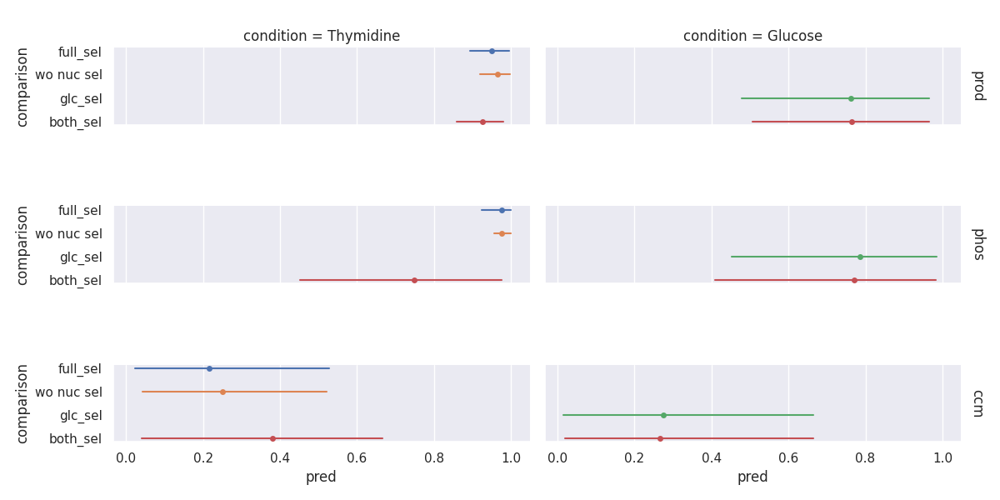

In [61]:
fg = (
    sns.FacetGrid(
        df_pred_all_sel,
        row="flux_ratio_name",
        col="condition",
        aspect=3,
        height=2,
        margin_titles=True
    )
    .map_dataframe(lineplots, y="comparison")
    .set_titles(row_template="{row_name}")
)
fg

In [62]:
df_feat_imp_full_sel.query("ratio_name == 'THYMD_uptake'").head(20)

,feature,importance,ratio_name
33,THYMD_12345678910_9,0.738945,THYMD_uptake_vs_prod
39,TMP_12345678910_10,0.087124,THYMD_uptake_vs_prod
32,THYMD_12345678910_1,0.069185,THYMD_uptake_vs_prod
31,THYMD_12345678910_0,0.067375,THYMD_uptake_vs_prod
36,TMP_12345678910_1,0.003686,THYMD_uptake_vs_prod
35,TMP_12345678910_0,0.003506,THYMD_uptake_vs_prod
43,UMP_123456789_6,0.003051,THYMD_uptake_vs_prod
38,TMP_12345678910_9,0.002206,THYMD_uptake_vs_prod
37,TMP_12345678910_8,0.001754,THYMD_uptake_vs_prod
34,THYMD_12345678910_10,0.001470,THYMD_uptake_vs_prod


In [89]:
df_pred = pd.concat([
    df_pred_all.assign(feature_subset=False), 
    df_pred_all_sel.assign(feature_subset=True)
], ignore_index=True)

df_pred.to_csv("../Output/CofeedBuni/thymd_predictions.csv", index=False)

In [93]:
df_pred.dropna().query("mae < 0.1")

,condition,flux_ratio,pred,pred_q10,pred_q90,mae,cv_mae_mean,cv_mae_sd,nucleoside,flux_ratio_name,comparison,feature_subset
0,Thymidine,THYMD_uptake,0.8745,0.711591,0.993382,0.025255,-0.025152,0.001504,THYMD,uptake,full,False
1,Thymidine,THYMD_phos,0.92251,0.726598,0.996689,0.009438,-0.010948,0.000526,THYMD,phos,full,False
2,Thymidine,THYMD_ccm,0.248572,0.025877,0.493052,0.097781,-0.097229,0.002577,THYMD,ccm,full,False
6,Thymidine,THYMD_uptake,0.964954,0.918634,0.99715,0.063879,-0.063899,0.001690,THYMD,uptake,wo nuc,False
7,Thymidine,THYMD_phos,0.958376,0.900686,0.995653,0.097369,-0.097527,0.002953,THYMD,phos,wo nuc,False
24,Thymidine,THYMD_uptake,0.949344,0.894054,0.995019,0.025263,-0.024950,0.001465,THYMD,uptake,full_sel,True
25,Thymidine,THYMD_phos,0.97609,0.924164,0.999162,0.008825,-0.010462,0.000452,THYMD,phos,full_sel,True
26,Thymidine,THYMD_ccm,0.216027,0.024056,0.52681,0.097670,-0.097014,0.002614,THYMD,ccm,full_sel,True
30,Thymidine,THYMD_uptake,0.96461,0.918634,0.997622,0.062986,-0.063295,0.001751,THYMD,uptake,wo nuc sel,True
31,Thymidine,THYMD_phos,0.975983,0.955926,0.998663,0.096869,-0.096547,0.003113,THYMD,phos,wo nuc sel,True


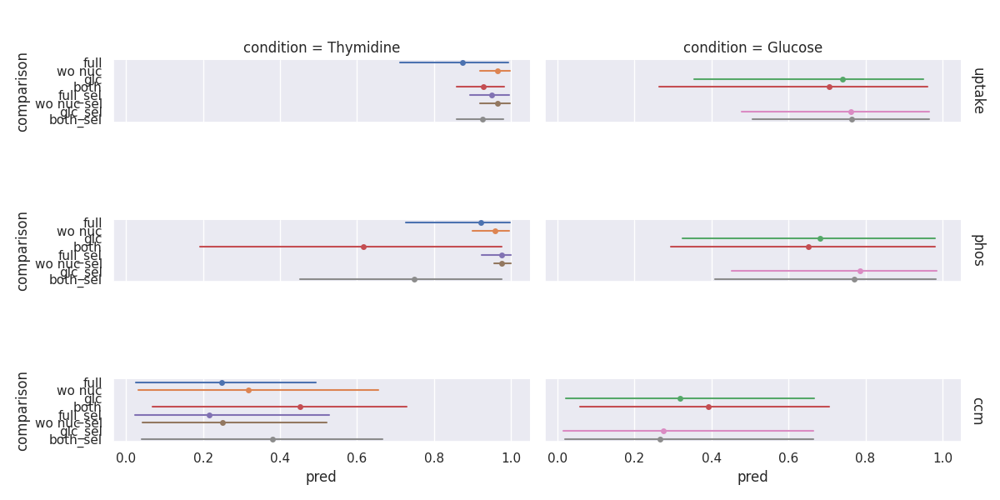

In [90]:
fg = (
    sns.FacetGrid(
        df_pred,
        row="flux_ratio_name",
        col="condition",
        aspect=3,
        height=2,
        margin_titles=True
    )
    .map_dataframe(lineplots, y="comparison")
    .set_titles(row_template="{row_name}")
)
fg

## Additional plots

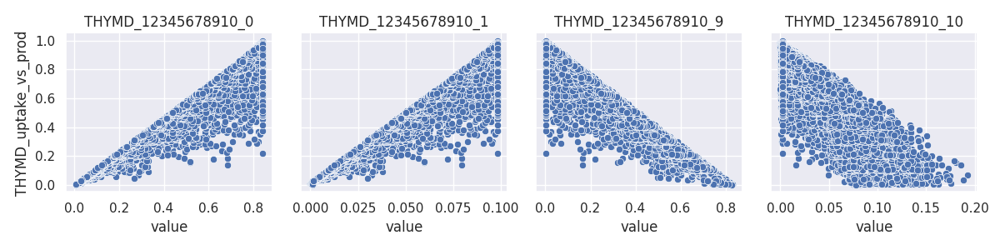

In [64]:
df_tmp = (
    df_mdvs_full_sel
    .transpose()
    .melt(ignore_index=False)
    .join(
        (df_fluxes.loc["THYMDin"] / (df_fluxes.loc["UMPK_TMDS"] + df_fluxes.loc["THYMDin"])).to_frame(name="THYMD_uptake")
    )
)

fg = (
    sns.FacetGrid(
        df_tmp.query("isotopo.str.startswith('THYMD')"),
        col="isotopo",
        col_wrap=4,
        sharex=False
    )
    .map_dataframe(
        sns.scatterplot,
        x="value",
        y="THYMD_uptake"
    )
    .set_titles(col_template="{col_name}")
)

In [65]:
df_mdv_comp = (
    pd.merge(
        df_mdvs
            .melt(ignore_index=False, var_name="sim_num", value_name="mdv_wo_noise")
            .reset_index(names="isotopo"),
        df_mdvs_with_noise
            .melt(ignore_index=False, var_name="sim_num", value_name="mdv_w_noise")
            .reset_index(names="isotopo"),
        on=["isotopo", "sim_num"],
        how="inner"
    )
    .assign(mb=lambda x: x.isotopo.str.extract("(.*)_.*_.*"))
)


<Axes: xlabel='mdv_wo_noise', ylabel='mdv_w_noise'>

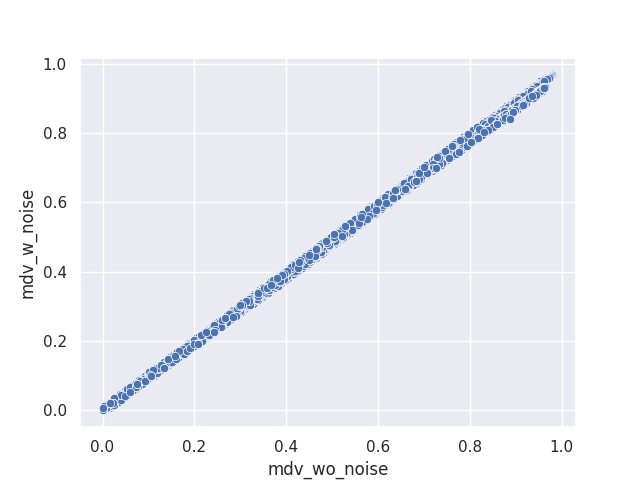

In [66]:
fig, ax = plt.subplots()
sns.scatterplot(df_mdv_comp, x="mdv_wo_noise", y="mdv_w_noise")

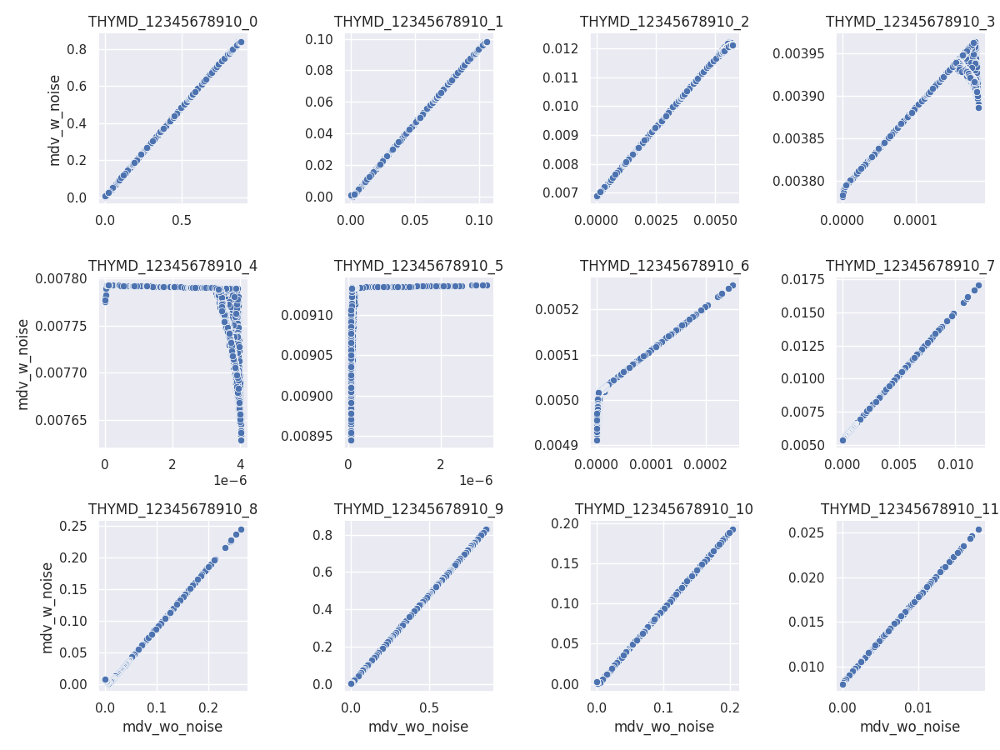

In [67]:
fg = (
    sns.FacetGrid(
        df_mdv_comp.query("mb == 'THYMD'"),
        col="isotopo",
        col_wrap=4,
        sharex=False,
        sharey=False
    )
    .map_dataframe(
        sns.scatterplot,
        x="mdv_wo_noise",
        y="mdv_w_noise"
    )
    .set_titles(col_template="{col_name}")
)

In [68]:
import shap

In [69]:
shap_train, shap_test = train_test_split(
    df_mdvs_full_sel.transpose(),
    test_size=0.3,
    random_state=42,
)

In [70]:
explainer = shap.TreeExplainer(res_full_sel['THYMD_uptake'][0])
rf_prob_shap_vals = explainer(shap_test)

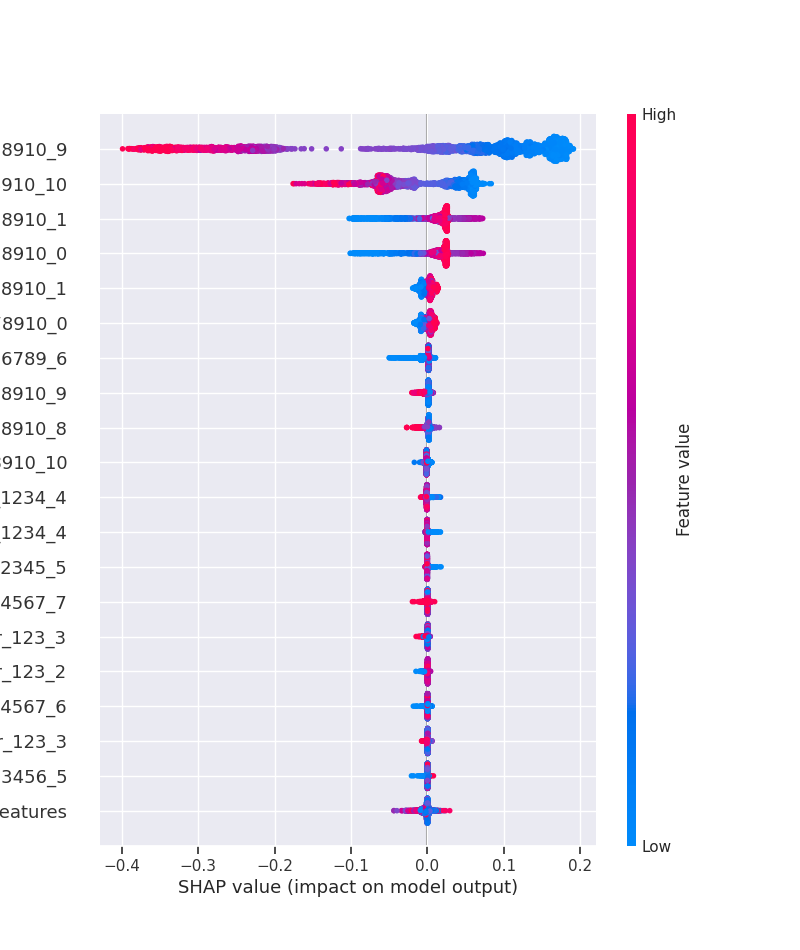

In [71]:
fig, ax = plt.subplots()
shap.plots.beeswarm(rf_prob_shap_vals[:], max_display=20)
fig.subplots_adjust(left=0.4)

## Just THYMD features

In [72]:
isotopo_list_just_sel = get_features_list(df_mdvs_with_noise_sel.query("index.str.startswith('THYMD')"), df_exp, "Thymidine")
df_exp_just_sel = df_exp.pipe(get_features_from_exp, "Thymidine", isotopo_list_just_sel)
df_exp_just_sel_glucose = df_exp.pipe(get_features_from_exp, "Glucose", isotopo_list_just_sel)
df_mdvs_just_sel = df_mdvs.reindex(isotopo_list_just_sel)

In [73]:
res_just_sel, df_feat_imp_just_sel = train_rf_for_all_flux_ratios(df_fluxes, df_mdvs_just_sel, thymd_flux_ratios_dict)

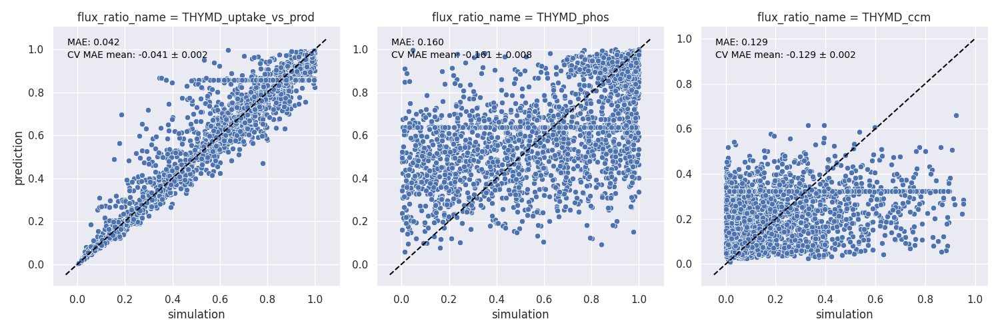

In [74]:
fg = plot_rf_results(res_just_sel, col_wrap=3)

In [75]:
df_feat_imp_just_sel

,feature,importance,ratio_name
2,THYMD_12345678910_9,0.832177,THYMD_uptake_vs_prod
0,THYMD_12345678910_0,0.084222,THYMD_uptake_vs_prod
1,THYMD_12345678910_1,0.064663,THYMD_uptake_vs_prod
3,THYMD_12345678910_10,0.018938,THYMD_uptake_vs_prod
3,THYMD_12345678910_10,0.458372,THYMD_phos
2,THYMD_12345678910_9,0.382265,THYMD_phos
1,THYMD_12345678910_1,0.079833,THYMD_phos
0,THYMD_12345678910_0,0.079530,THYMD_phos
2,THYMD_12345678910_9,0.371380,THYMD_ccm
3,THYMD_12345678910_10,0.366884,THYMD_ccm


In [76]:
df_pred_just_sel = (
    pd.concat([
        get_rf_pred_results(res_just_sel, df_exp_just_sel, "Thymidine"),
        get_rf_pred_results(res_just_sel, df_exp_just_sel_glucose, "Glucose")
    ], ignore_index=True)
    .assign(comparison="just_thymd_sel")
)

df_pred_just_sel

,condition,flux_ratio,pred,pred_q10,pred_q90,mae,cv_mae_mean,cv_mae_sd,nucleoside,flux_ratio_name,comparison
0,Thymidine,THYMD_uptake_vs_prod,0.869485,0.846671,0.993106,0.041674,-0.040811,0.002461,THYMD_uptake_vs,prod,just_thymd_sel
1,Thymidine,THYMD_phos,0.578406,0.230452,0.99926,0.159591,-0.160774,0.007878,THYMD,phos,just_thymd_sel
2,Thymidine,THYMD_ccm,0.315595,0.309173,0.334708,0.128689,-0.128782,0.002344,THYMD,ccm,just_thymd_sel
3,Glucose,THYMD_uptake_vs_prod,NaN,NaN,NaN,0.041674,-0.040811,0.002461,THYMD_uptake_vs,prod,just_thymd_sel
4,Glucose,THYMD_phos,NaN,NaN,NaN,0.159591,-0.160774,0.007878,THYMD,phos,just_thymd_sel
5,Glucose,THYMD_ccm,NaN,NaN,NaN,0.128689,-0.128782,0.002344,THYMD,ccm,just_thymd_sel


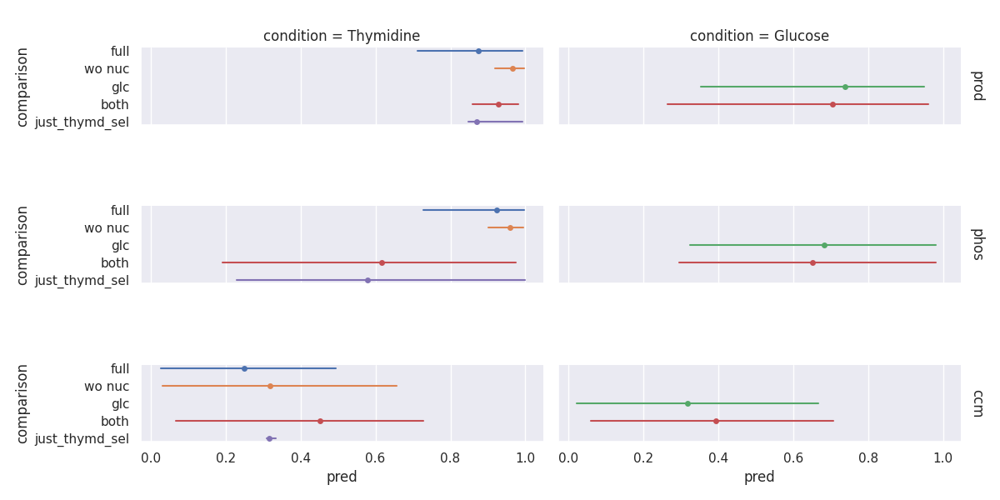

In [77]:
fg = (
    sns.FacetGrid(
        pd.concat([df_pred_all, df_pred_just_sel], ignore_index=True),
        # df_pred_all,
        row="flux_ratio_name",
        col="condition",
        aspect=3,
        height=2,
        margin_titles=True
    )
    .map_dataframe(lineplots, y="comparison")
    .set_titles(row_template="{row_name}")
)
fg

In [78]:
chosen_isos = ["THYMD_12345678910_0", "THYMD_12345678910_9"]

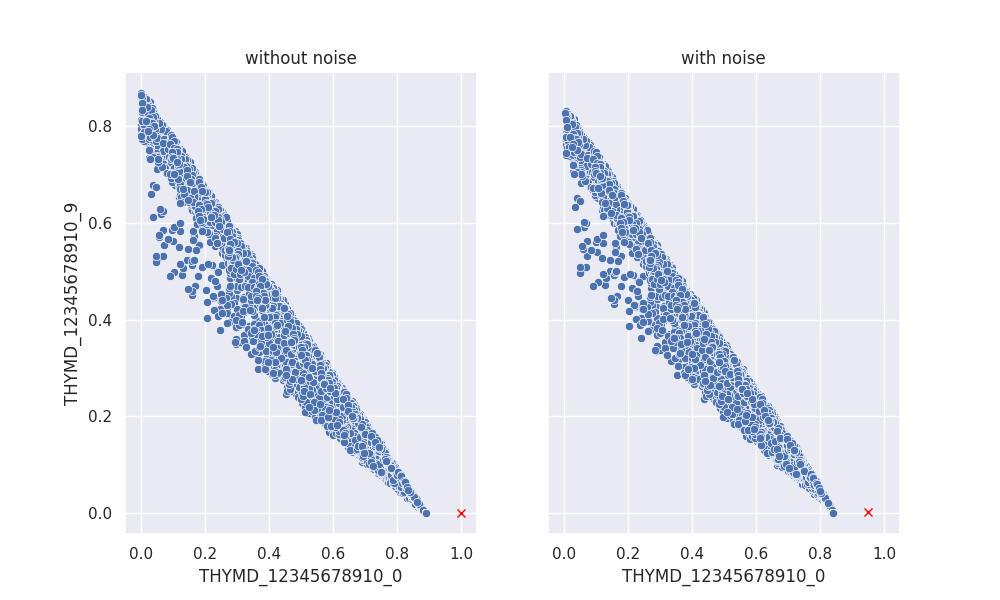

In [79]:
fig, axs = plt.subplots(1, 2, figsize=(10, 6), sharex=True, sharey=True)
sns.scatterplot(df_mdvs.loc[chosen_isos].transpose(), x="THYMD_12345678910_0", y="THYMD_12345678910_9", ax=axs[0])
axs[0].set(title="without noise")

sns.scatterplot(df_mdvs_with_noise.loc[chosen_isos].transpose(), x="THYMD_12345678910_0", y="THYMD_12345678910_9", ax=axs[1])
axs[1].set(title="with noise")

axs[0].plot(*df_exp.query("medium == 'Thymidine' and isotopo in @chosen_isos").mdv.to_list(), "x", color="red")
axs[1].plot(*df_exp_full_sel.query("medium == 'Thymidine' and isotopo in @chosen_isos").mdv.to_list(), "x", color="red")